# Exploration of cartography visualisations through french election 2024
This project aims at exploring different ways to show the results of election in France in 2024. Results of one circonscription, grouped by cities are used. Different maps are shown with different packages.

In [1]:
import pandas as pd
import json
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import folium
from folium import plugins
import dash
import dash_leaflet as dl
import os
os.chdir("C:\\Users\\matth\\Documents\\09 - idées en vrac\\02 - Proj cod\\politique\\Legislative_2024")

c:\Users\matth\anaconda3\lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


## Static visualisation
### Importing data and selection of a circonscription

In [2]:
df_ma_circo = pd.read_csv('data\\resultats-definitifs-par-commune.csv', sep =';')
df_ma_circo = df_ma_circo.loc[(df_ma_circo['Nom candidat 1'] == 'GIRY') & (df_ma_circo['Nom candidat 2']=='TRAVERT')]
mask = -df_ma_circo[[c for c in df_ma_circo.columns]].isna().any()
df_ma_circo = df_ma_circo[df_ma_circo.columns[mask]]

C:\Users\matth\AppData\Local\Temp\ipykernel_21652\265904046.py:1: DtypeWarning: Columns (0,2,62,71,80,82,83,84,85,87,88,89,91,92,93,94,96,97,98,100,101,102,103,105,106,107,109,110,111,112,114,115,116,118,119,120,121,123,124,125,127,128,129,130,132,133,134,136,137,138,139,141,142,143,145,146,147,148,150,151,154,155,156,157,159,160,163,164,165,166,168,169,172,173,174,175,177,178) have mixed types. Specify dtype option on import or set low_memory=False.
  df_ma_circo = pd.read_csv('data\\resultats-definitifs-par-commune.csv', sep =';')


In [3]:
shapefile_path = 'data\\commune-frmetdrom\\COMMUNE_FRMETDROM.shp'
communes = gpd.read_file(shapefile_path)
# Filter the communes for the specific department
department_code = '50'  # Selct "Manche" departement
filtered_communes = communes[communes['INSEE_DEP'].str.contains(department_code)]
# Filter communes that are in my circonscription
filtered_communes2 = filtered_communes[filtered_communes.INSEE_COM.isin(df_ma_circo['Code commune'].astype('str'))]
filtered_communes2['INSEE_COM'] = filtered_communes2['INSEE_COM'].astype(int)
# Select some cities to print the text

c:\Users\matth\anaconda3\lib\site-packages\geopandas\geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [4]:
df_ma_circo.rename(columns = {'% Voix/exprimés 1': 'prop_voix_exp_1', '% Voix/exprimés 2': 'prop_voix_exp_2', '% Abstentions':'prop_abstention'}, inplace= True)
df_ma_circo = df_ma_circo.set_index('Code commune')
# Change percentage string into float
col_to_cast = ['prop_voix_exp_1', 'prop_voix_exp_2', 'prop_abstention']
for col in col_to_cast:
    df_ma_circo[col] = df_ma_circo[col].apply(lambda x: float(x.split('%')[0].replace(',', '.')))
# Create a winner column
df_ma_circo['vainqueur'] = df_ma_circo['prop_voix_exp_1'].apply(lambda x: 'GIRY' if x>50 else 'TRAVERT')
# Put the name of the winner on the geographical dataframe
filtered_communes2 = filtered_communes2.sort_values(by='INSEE_COM')
filtered_communes3 = filtered_communes2.set_index('INSEE_COM')
filtered_communes3['vainqueur'] = df_ma_circo['vainqueur']

C:\Users\matth\AppData\Local\Temp\ipykernel_21652\2649299539.py:8: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroids = df_cities_to_text.geometry.centroid
C:\Users\matth\AppData\Local\Temp\ipykernel_21652\2649299539.py:19: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  filtered_communes3['vainqueur_num'] = filtered_communes3['vainqueur'].replace({'GIRY': 0, 'TRAVERT': 1})


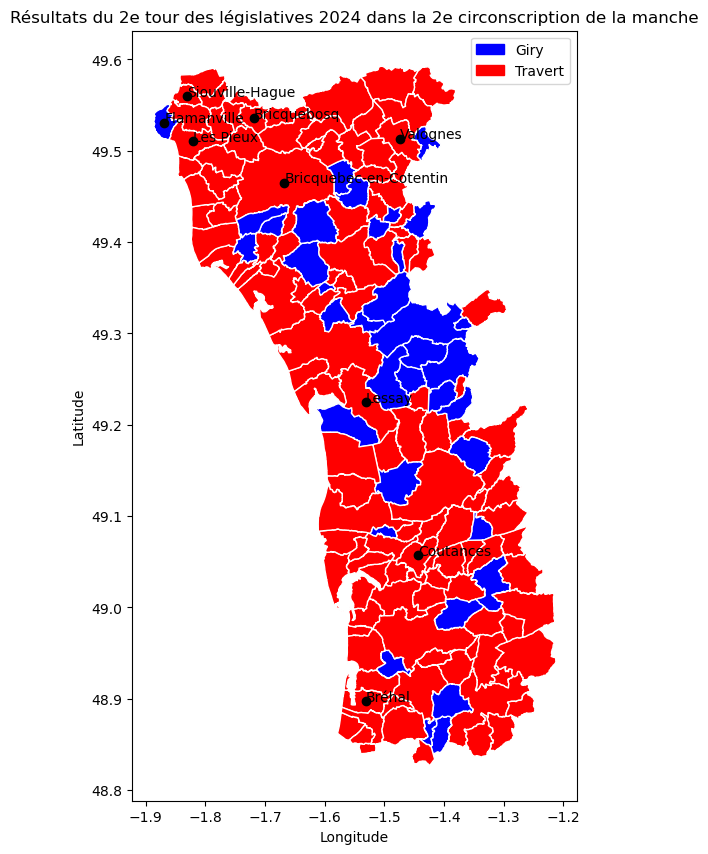

In [5]:
# Plot the boundaries
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

cities_to_text = ['LES PIEUX', 'COUTANCES', 'FLAMANVILLE', 'LESSAY', 'SIOUVILLE-HAGUE', 
                  'BRICQUEBOSQ', 'BRICQUEBEC-EN-COTENTIN', 'BREHAL', 'VALOGNES', ]
df_cities_to_text = filtered_communes2[filtered_communes2.NOM_M.isin(cities_to_text)]
# Add labels for each city
centroids = df_cities_to_text.geometry.centroid
# Prepare data for scatter plot
x = centroids.x
y = centroids.y
ax.scatter(x, y, c='black', edgecolor='black', zorder=5)

for idx, row in df_cities_to_text.iterrows():
    ax.text(row.geometry.centroid.x, row.geometry.centroid.y, row['NOM'], ha = 'left', color = 'black', fontsize=10)
map = mcolors.ListedColormap(['blue', 'red'])

# Create a new column in the GeoDataFrame that maps the values in the 'vaingueur' column to numbers
filtered_communes3['vainqueur_num'] = filtered_communes3['vainqueur'].replace({'GIRY': 0, 'TRAVERT': 1})
filtered_communes3.plot(ax=ax, edgecolor = 'white', column='vainqueur_num', cmap = map)
giry_patch = mpatches.Patch(color='blue', label='Giry')
travert_patch = mpatches.Patch(color='red', label='Travert')

ax.legend(handles=[giry_patch, travert_patch])
plt.title(f'Résultats du 2e tour des législatives 2024 dans la 2e circonscription de la manche')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.savefig('img/resultat_circo_manche.png')
plt.show()


C:\Users\matth\AppData\Local\Temp\ipykernel_21652\510868751.py:10: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm)


Text(0.5, 1.0, 'Résultats 2e tour élection législative ')

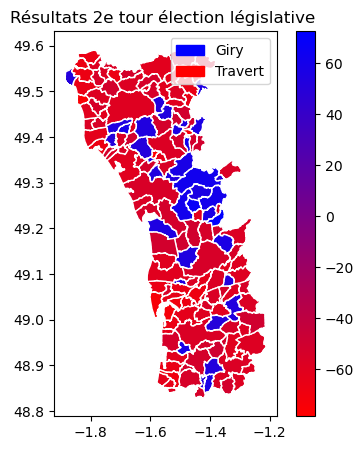

In [6]:
# Plot results with a percentage scale and colormap
cmap = mcolors.LinearSegmentedColormap.from_list('custom_cmap', ['red', 'blue'], N=256)

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
filtered_communes3['proportion'] = df_ma_circo[['prop_voix_exp_1', 'prop_voix_exp_2']].apply(lambda x: x.prop_voix_exp_1 if x.prop_voix_exp_1 >50 else - x.prop_voix_exp_2, axis = 1 )
filtered_communes3.plot(ax=ax, edgecolor = 'white', column='proportion', cmap = cmap)

sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=filtered_communes3['proportion'].min(), vmax=filtered_communes3['proportion'].max()))
sm._A = []
cbar = plt.colorbar(sm)
giry_patch = mpatches.Patch(color='blue', label='Giry')
travert_patch = mpatches.Patch(color='red', label='Travert')
ax.legend(handles=[giry_patch, travert_patch])

plt.title("Résultats 2e tour élection législative ")

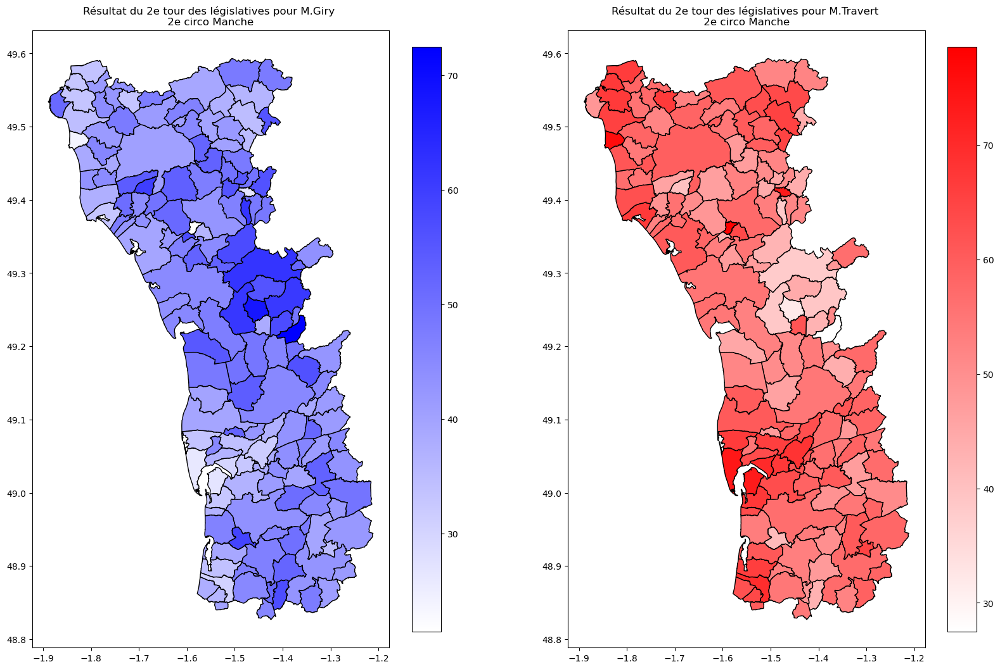

In [7]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 20))

# Create custom colormaps for each axis
cmap1 = mcolors.LinearSegmentedColormap.from_list('custom_cmap1', ['white', 'blue'], N=256)
cmap2 = mcolors.LinearSegmentedColormap.from_list('custom_cmap2', ['white', 'red'], N=256)

# Create new columns in the GeoDataFrame that contain the percentage values for each axis
filtered_communes3['percentage1'] =  df_ma_circo['prop_voix_exp_1']
filtered_communes3['percentage2'] =  df_ma_circo['prop_voix_exp_2']

# Plot the GeoDataFrame on the first axis using the first colormap
filtered_communes3.plot(ax=ax1, edgecolor='black', column='percentage1', cmap=cmap1)

# Plot the GeoDataFrame on the second axis using the second colormap
filtered_communes3.plot(ax=ax2, edgecolor='black', column='percentage2', cmap=cmap2)

# Add colorbars to each axis
sm1 = plt.cm.ScalarMappable(cmap=cmap1, norm=plt.Normalize(vmin=filtered_communes3['percentage1'].min(), vmax=filtered_communes3['percentage1'].max()))
sm1._A = []
cbar1 = plt.colorbar(sm1, ax=ax1, shrink = 0.6)

sm2 = plt.cm.ScalarMappable(cmap=cmap2, norm=plt.Normalize(vmin=filtered_communes3['percentage2'].min(), vmax=filtered_communes3['percentage2'].max()))
sm2._A = []
cbar2 = plt.colorbar(sm2, ax=ax2, shrink = 0.6)

ax1.set_title("Résultat du 2e tour des législatives pour M.Giry \n 2e circo Manche ")
ax2.set_title("Résultat du 2e tour des législatives pour M.Travert \n 2e circo Manche ")
# Show the figure
plt.savefig("img/resultats_par_candidat.png")
plt.show()

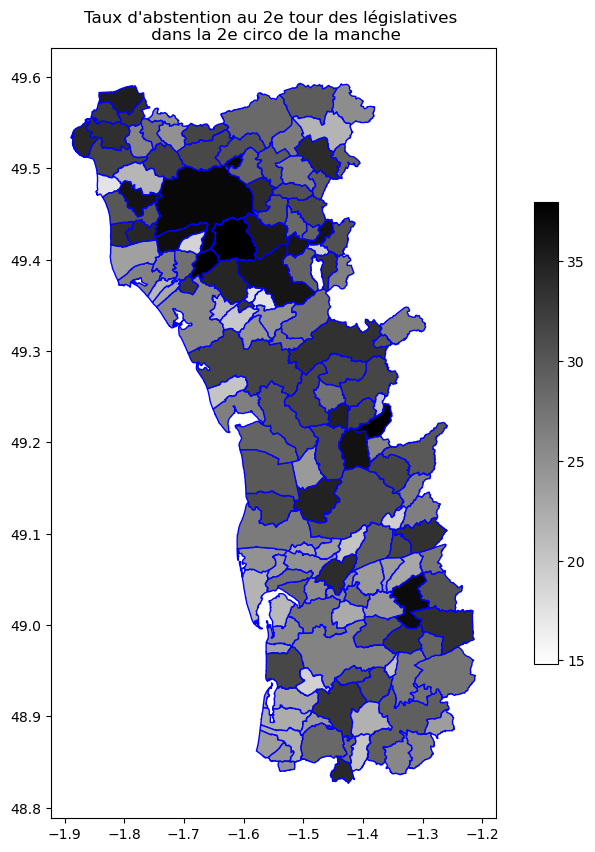

In [8]:
filtered_communes3['prop_abstention'] = df_ma_circo['prop_abstention']
fig, ax = plt.subplots(figsize=(10, 10))
cmap = plt.cm.gray.reversed()
filtered_communes3.plot(ax=ax, edgecolor='blue', column='prop_abstention', cmap=cmap)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=filtered_communes3['prop_abstention'].min(), vmax=filtered_communes3['prop_abstention'].max()))
sm._A = []
cbar = plt.colorbar(sm, ax=ax, shrink = 0.6)
ax.set_title("Taux d'abstention au 2e tour des législatives \n dans la 2e circo de la manche")
plt.savefig("img/abstention.png")
plt.show()


### Cartography using folium

In [10]:
# Define a function to determine the color of each city based on its population
def color_scale(vainqueur):
    if vainqueur == 'TRAVERT':
        return 'red'
    elif vainqueur == 'GIRY': # Si Giry est arrivé en tête
        return 'blue'

# Create a map centered around the cities
m = folium.Map(location=[filtered_communes3.centroid.y.mean(), filtered_communes3.centroid.x.mean()], zoom_start=10)

# Add the city boundaries to the map, with color based on propoprtion de voix exprimés
folium.GeoJson(
    filtered_communes3,
    style_function=lambda feature: {
         'fillColor': color_scale(feature['properties']['vainqueur']),
        'color': 'black',
        'weight': 2,
        'fillOpacity': 0.5
    },
    tooltip=folium.GeoJsonTooltip(fields=['NOM', 'percentage1', 'percentage2'],
                                  aliases=['Commune : ', '\% voix exprimés GIRY:', '\% voix exprimés TRAVERT'],
                                  labels=True,
                                  sticky=False)
).add_to(m)

m

C:\Users\matth\AppData\Local\Temp\ipykernel_21652\1810313603.py:9: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[filtered_communes3.centroid.y.mean(), filtered_communes3.centroid.x.mean()], zoom_start=10)


In [11]:
#Using folium chloropeth
map_chloro = folium.Map(location=[filtered_communes3.centroid.y.mean(), filtered_communes3.centroid.x.mean()], zoom_start=10)
folium.Choropleth(
    geo_data=filtered_communes2,
    name="choropleth",
    data=filtered_communes3,
    columns=["NOM", "percentage1"],
    key_on="feature.id",
    fill_color="YlGn",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Percentage for Giry)",
).add_to(map_chloro)
map_chloro


C:\Users\matth\AppData\Local\Temp\ipykernel_21652\102155319.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  map_chloro = folium.Map(location=[filtered_communes3.centroid.y.mean(), filtered_communes3.centroid.x.mean()], zoom_start=10)


# Conclusion
We used different ways to display election results of one circonscription. The static representation using matplotlib enables to stick at our circonscription.
The second way using follium enables to show the map of France but does not stick to the circonscription 